In [1]:
#確認
import os
os.environ.pop('CUDA_LAUNCH_BLOCKING', None)
import torch
print(torch.cuda.is_available())
print(torch.cuda.get_device_name())
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

import cv2
import logging
import pandas as pd
import logging
import os
from multiprocessing import Pool, Manager
import functools
import tqdm

True
GeForce RTX 3070


In [2]:
#make model
from vision.ssd.mobilenetv3_ssd_lite import create_mobilenetv3_small_ssd_lite
from vision.ssd.config import mobilenetv1_ssd_config
create_net = lambda num: create_mobilenetv3_small_ssd_lite(num, onnx_compatible=True)
config = mobilenetv1_ssd_config

In [3]:
from vision.transforms.transforms import *

class outputTransform:
    def __init__(self, size, mean=0.0, std=1.0):
        self.transform = Compose([
            ToPercentCoords(),
            Resize(size),
            DisplayObject(),
            SubtractMeans(mean),
            lambda img, boxes=None, labels=None: (img / std, boxes, labels),
            ToTensor(),
        ])

    def __call__(self, image, boxes, labels):
        return self.transform(image, boxes, labels)

In [4]:
#prepare tranform
from vision.ssd.ssd import MatchPrior
target_transform = MatchPrior(config.priors, config.center_variance, config.size_variance, 0.5)
test_transform = outputTransform(config.image_size, config.image_mean, config.image_std)
logging.info("Prepare training datasets.")

In [5]:
#optunaでカリカリにチューニングする
Param = {
    "batch_size" : 8,
    "base_net_lr" : 0.001, #tune
    "num_epochs" : 200,
    "validation_epochs" : 5,
    "t_max" : 100, #tune
    "lr" : 0.01, #tune
    "scheduler" : "cosine", #<-変えてもOK #tune
    "freeze_base_net" : False, #ファインチューニングするときはTrue,
    "freeze_net" : False,
    "num_workers" : 2, #並列処理 windows対応してないです…
    "momentum" : 0.9, #tune
    "weight_decay" : 5e-4, #tune
    "t_max" : 100, #tune
    "debug_steps" : 100,
}

import multiprocessing
cpu_count = multiprocessing.cpu_count()
print(cpu_count)
Param["num_workers"] = min(2, cpu_count)

dataset_path = "./all_images"

20


In [6]:
from vision.utils.misc import str2bool, Timer, freeze_net_layers, store_labels
from torch.utils.data import DataLoader, ConcatDataset
#TODO データセットのライブラリ作る、transformも -> OpenImagesDatasetをたたき台にする 最終的にsub-{}-annotation-bboxに統合する
from vision.datasets.open_images import OpenImagesDataset
from vision.datasets.pseudo_dataset import pseudoDataset
from vision.datasets.pseudo_dataset_can import pseudoDatasetCan
import glob

In [7]:
logging.info("Prepare Validation datasets.")
valdatasets = []

val_dataset = OpenImagesDataset(dataset_path, transform=test_transform, target_transform=target_transform, dataset_type="test")
valdatasets.append(val_dataset)

['trafficcone', 'can']


[ 67.3363   58.73016 121.27976 180.75398]
[115.252975 211.80556  130.80357  239.38492 ]
[144.56845 199.10713 153.64584 223.31349]
[ 67.3363   58.73016 121.27976 180.75398]
[115.252975 211.80556  130.80357  239.38492 ]
[144.56845 199.10713 153.64584 223.31349]
[ 67.3363   58.73016 121.27976 180.75398]
[115.252975 211.80556  130.80357  239.38492 ]
[144.56845 199.10713 153.64584 223.31349]
[ 67.3363   58.73016 121.27976 180.75398]
[115.252975 211.80556  130.80357  239.38492 ]
[144.56845 199.10713 153.64584 223.31349]
[ 67.3363   58.73016 121.27976 180.75398]
[115.252975 211.80556  130.80357  239.38492 ]
[144.56845 199.10713 153.64584 223.31349]


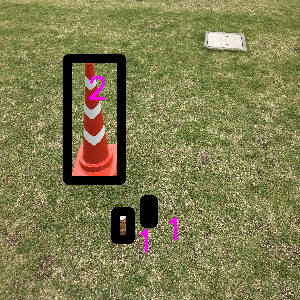

[ 64.73214  48.31349 133.33333 201.98413]
[172.24702 187.59921 189.50893 222.12302]
[186.90477 173.80952 200.29762 200.29762]
[ 64.73214  48.31349 133.33333 201.98413]
[172.24702 187.59921 189.50893 222.12302]
[186.90477 173.80952 200.29762 200.29762]
[ 64.73214  48.31349 133.33333 201.98413]
[172.24702 187.59921 189.50893 222.12302]
[186.90477 173.80952 200.29762 200.29762]
[ 64.73214  48.31349 133.33333 201.98413]
[172.24702 187.59921 189.50893 222.12302]
[186.90477 173.80952 200.29762 200.29762]
[ 64.73214  48.31349 133.33333 201.98413]
[172.24702 187.59921 189.50893 222.12302]
[186.90477 173.80952 200.29762 200.29762]


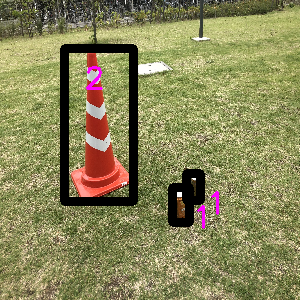

[252.08334 132.34126 270.2381  168.55159]
[270.2381   120.833336 286.2351   153.07541 ]
[143.75       4.563492 209.375    136.90475 ]
[252.08334 132.34126 270.2381  168.55159]
[270.2381   120.833336 286.2351   153.07541 ]
[143.75       4.563492 209.375    136.90475 ]
[252.08334 132.34126 270.2381  168.55159]
[270.2381   120.833336 286.2351   153.07541 ]
[143.75       4.563492 209.375    136.90475 ]
[252.08334 132.34126 270.2381  168.55159]
[270.2381   120.833336 286.2351   153.07541 ]
[143.75       4.563492 209.375    136.90475 ]
[252.08334 132.34126 270.2381  168.55159]
[270.2381   120.833336 286.2351   153.07541 ]
[143.75       4.563492 209.375    136.90475 ]


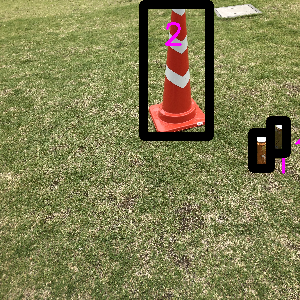

[ 56.54762  62.20238 133.40775 219.94048]
[179.9851  123.21429 190.3274  147.42064]
[188.16965 143.35318 201.11607 169.24603]
[ 56.54762  62.20238 133.40775 219.94048]
[179.9851  123.21429 190.3274  147.42064]
[188.16965 143.35318 201.11607 169.24603]
[ 56.54762  62.20238 133.40775 219.94048]
[179.9851  123.21429 190.3274  147.42064]
[188.16965 143.35318 201.11607 169.24603]
[ 56.54762  62.20238 133.40775 219.94048]
[179.9851  123.21429 190.3274  147.42064]
[188.16965 143.35318 201.11607 169.24603]
[ 56.54762  62.20238 133.40775 219.94048]
[179.9851  123.21429 190.3274  147.42064]
[188.16965 143.35318 201.11607 169.24603]


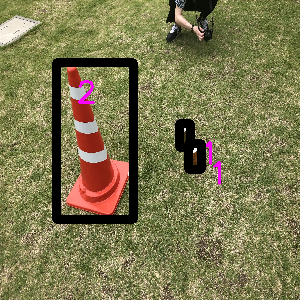

[ 44.86607    2.281746 141.59225  198.5119  ]
[171.8006   69.64285 186.01192 100.69444]
[150.22322  66.76588 161.45833  93.25397]
[171.8006   69.64285 186.01192 100.69444]
[150.22322  66.76588 161.45833  93.25397]
[171.8006   69.64285 186.01192 100.69444]
[150.22322  66.76588 161.45833  93.25397]
[ 44.86607    2.281746 141.59225  198.5119  ]
[171.8006   69.64285 186.01192 100.69444]
[150.22322  66.76588 161.45833  93.25397]
[ 44.86607    2.281746 141.59225  198.5119  ]
[171.8006   69.64285 186.01192 100.69444]
[150.22322  66.76588 161.45833  93.25397]


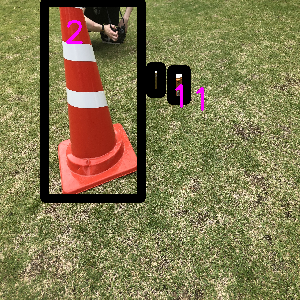

[145.90773   87.5      157.14287  112.797615]
[122.61904  90.97222 132.5149  110.51587]
[ 90.25298  65.57539 171.8006  243.94841]
[145.90773   87.5      157.14287  112.797615]
[122.61904  90.97222 132.5149  110.51587]
[ 90.25298  65.57539 171.8006  243.94841]
[145.90773   87.5      157.14287  112.797615]
[122.61904  90.97222 132.5149  110.51587]
[ 90.25298  65.57539 171.8006  243.94841]
[145.90773   87.5      157.14287  112.797615]
[122.61904  90.97222 132.5149  110.51587]
[ 90.25298  65.57539 171.8006  243.94841]
[145.90773   87.5      157.14287  112.797615]
[122.61904  90.97222 132.5149  110.51587]
[ 90.25298  65.57539 171.8006  243.94841]


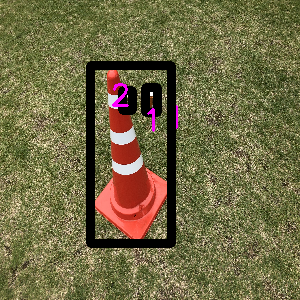

[ 70.3869   57.53968 146.35416 223.90874]
[191.22025 101.88492 203.2738  127.18254]
[205.05952 126.09127 218.89882 153.1746 ]
[ 70.3869   57.53968 146.35416 223.90874]
[191.22025 101.88492 203.2738  127.18254]
[205.05952 126.09127 218.89882 153.1746 ]
[ 70.3869   57.53968 146.35416 223.90874]
[191.22025 101.88492 203.2738  127.18254]
[205.05952 126.09127 218.89882 153.1746 ]
[ 70.3869   57.53968 146.35416 223.90874]
[191.22025 101.88492 203.2738  127.18254]
[205.05952 126.09127 218.89882 153.1746 ]
[ 70.3869   57.53968 146.35416 223.90874]
[191.22025 101.88492 203.2738  127.18254]
[205.05952 126.09127 218.89882 153.1746 ]


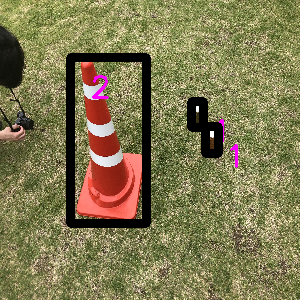

[222.32143  90.97222 241.74107 130.05952]
[229.6131  124.90079 253.34822 173.21428]
[  3.422619     0.59523815 127.75298    214.08731   ]
[222.32143  90.97222 241.74107 130.05952]
[229.6131  124.90079 253.34822 173.21428]
[  3.422619     0.59523815 127.75298    214.08731   ]
[222.32143  90.97222 241.74107 130.05952]
[229.6131  124.90079 253.34822 173.21428]
[  3.422619     0.59523815 127.75298    214.08731   ]
[222.32143  90.97222 241.74107 130.05952]
[229.6131  124.90079 253.34822 173.21428]
[  3.422619     0.59523815 127.75298    214.08731   ]
[222.32143  90.97222 241.74107 130.05952]
[229.6131  124.90079 253.34822 173.21428]
[  3.422619     0.59523815 127.75298    214.08731   ]


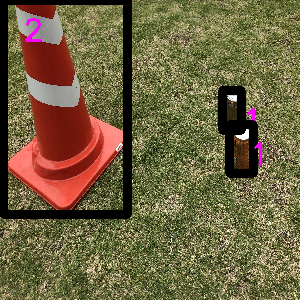

[157.5893    93.849205 173.5863   131.25    ]
[167.93155 123.21429 189.50893 171.52779]
[  1.264881 101.28968   60.863094 237.10318 ]
[157.5893    93.849205 173.5863   131.25    ]
[167.93155 123.21429 189.50893 171.52779]
[  1.264881 101.28968   60.863094 237.10318 ]
[157.5893    93.849205 173.5863   131.25    ]
[167.93155 123.21429 189.50893 171.52779]
[  1.264881 101.28968   60.863094 237.10318 ]
[157.5893    93.849205 173.5863   131.25    ]
[167.93155 123.21429 189.50893 171.52779]
[  1.264881 101.28968   60.863094 237.10318 ]
[157.5893    93.849205 173.5863   131.25    ]
[167.93155 123.21429 189.50893 171.52779]
[  1.264881 101.28968   60.863094 237.10318 ]


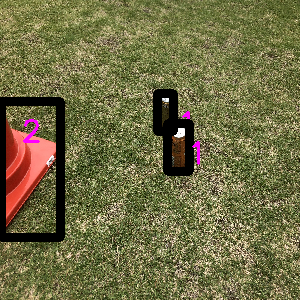

[ 60.863094   2.281746 143.30357  163.39285 ]
[186.01192 169.24603 215.7738  231.44841]
[222.32143 147.32143 245.6101  192.75793]
[ 60.863094   2.281746 143.30357  163.39285 ]
[186.01192 169.24603 215.7738  231.44841]
[222.32143 147.32143 245.6101  192.75793]
[ 60.863094   2.281746 143.30357  163.39285 ]
[186.01192 169.24603 215.7738  231.44841]
[222.32143 147.32143 245.6101  192.75793]
[ 60.863094   2.281746 143.30357  163.39285 ]
[186.01192 169.24603 215.7738  231.44841]
[222.32143 147.32143 245.6101  192.75793]
[ 60.863094   2.281746 143.30357  163.39285 ]
[186.01192 169.24603 215.7738  231.44841]
[222.32143 147.32143 245.6101  192.75793]


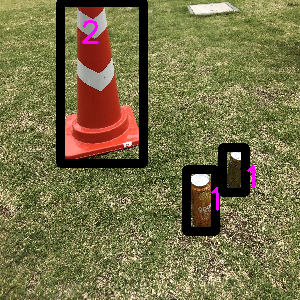

[255.50597 145.03969 280.9524  203.76984]
[122.991066   3.472222 204.5387   128.96825 ]
[255.50597 145.03969 280.9524  203.76984]
[122.991066   3.472222 204.5387   128.96825 ]
[255.50597 145.03969 280.9524  203.76984]
[122.991066   3.472222 204.5387   128.96825 ]
[255.50597 145.03969 280.9524  203.76984]
[122.991066   3.472222 204.5387   128.96825 ]
[255.50597 145.03969 280.9524  203.76984]
[122.991066   3.472222 204.5387   128.96825 ]


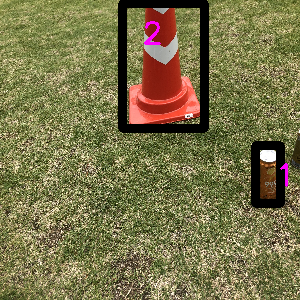

[ 96.72619  75.99206 147.24702 188.78967]
[156.69643 134.72221 165.32738 151.38889]
[ 96.72619  75.99206 147.24702 188.78967]
[156.69643 134.72221 165.32738 151.38889]
[ 96.72619  75.99206 147.24702 188.78967]
[156.69643 134.72221 165.32738 151.38889]
[ 96.72619  75.99206 147.24702 188.78967]
[156.69643 134.72221 165.32738 151.38889]
[ 96.72619  75.99206 147.24702 188.78967]
[156.69643 134.72221 165.32738 151.38889]


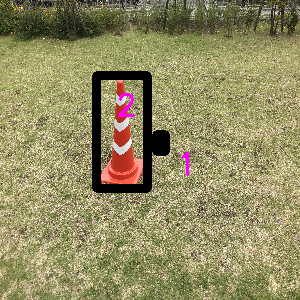

[ 95.38691   20.138887 148.06548  153.07541 ]
[142.41072 113.9881  154.46428 135.31746]
[ 95.38691   20.138887 148.06548  153.07541 ]
[142.41072 113.9881  154.46428 135.31746]
[ 95.38691   20.138887 148.06548  153.07541 ]
[142.41072 113.9881  154.46428 135.31746]
[ 95.38691   20.138887 148.06548  153.07541 ]
[142.41072 113.9881  154.46428 135.31746]
[ 95.38691   20.138887 148.06548  153.07541 ]
[142.41072 113.9881  154.46428 135.31746]


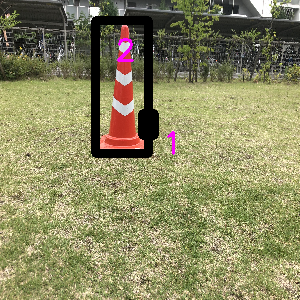

[119.56845  42.55952 165.7738  150.79364]
[154.5387  133.53175 163.61607 151.98412]
[119.56845  42.55952 165.7738  150.79364]
[154.5387  133.53175 163.61607 151.98412]
[119.56845  42.55952 165.7738  150.79364]
[154.5387  133.53175 163.61607 151.98412]
[119.56845  42.55952 165.7738  150.79364]
[154.5387  133.53175 163.61607 151.98412]
[119.56845  42.55952 165.7738  150.79364]
[154.5387  133.53175 163.61607 151.98412]


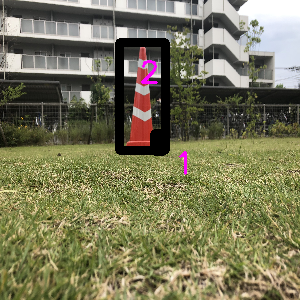

[ 46.205357 128.96825   55.729168 149.10715 ]
[ 33.25893  70.2381  104.01785 216.46825]
[ 46.205357 128.96825   55.729168 149.10715 ]
[ 33.25893  70.2381  104.01785 216.46825]
[ 46.205357 128.96825   55.729168 149.10715 ]
[ 33.25893  70.2381  104.01785 216.46825]
[ 46.205357 128.96825   55.729168 149.10715 ]
[ 33.25893  70.2381  104.01785 216.46825]
[ 46.205357 128.96825   55.729168 149.10715 ]
[ 33.25893  70.2381  104.01785 216.46825]


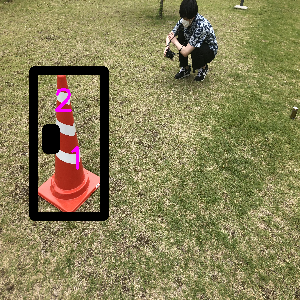

[232.6637  130.05952 243.8988  155.35715]
[253.79465  73.71032 299.10715 226.7857 ]
[232.6637  130.05952 243.8988  155.35715]
[253.79465  73.71032 299.10715 226.7857 ]
[232.6637  130.05952 243.8988  155.35715]
[253.79465  73.71032 299.10715 226.7857 ]
[232.6637  130.05952 243.8988  155.35715]
[253.79465  73.71032 299.10715 226.7857 ]
[232.6637  130.05952 243.8988  155.35715]
[253.79465  73.71032 299.10715 226.7857 ]


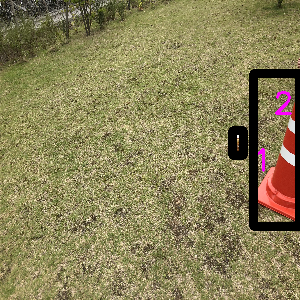

[134.22618   85.218254 148.06548  114.583336]
[133.40775     1.1904763 233.55655   196.8254   ]
[134.22618   85.218254 148.06548  114.583336]
[133.40775     1.1904763 233.55655   196.8254   ]
[134.22618   85.218254 148.06548  114.583336]
[133.40775     1.1904763 233.55655   196.8254   ]
[134.22618   85.218254 148.06548  114.583336]
[133.40775     1.1904763 233.55655   196.8254   ]
[134.22618   85.218254 148.06548  114.583336]
[133.40775     1.1904763 233.55655   196.8254   ]


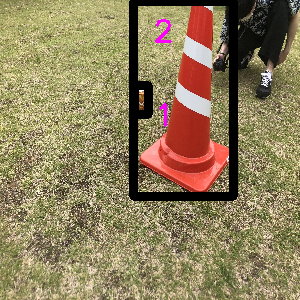

[  0.4464285 102.48016    20.3125    149.10715  ]
[ 90.25298    3.472222 218.00597  181.84525 ]
[  0.4464285 102.48016    20.3125    149.10715  ]
[ 90.25298    3.472222 218.00597  181.84525 ]
[  0.4464285 102.48016    20.3125    149.10715  ]
[ 90.25298    3.472222 218.00597  181.84525 ]
[  0.4464285 102.48016    20.3125    149.10715  ]
[ 90.25298    3.472222 218.00597  181.84525 ]
[  0.4464285 102.48016    20.3125    149.10715  ]
[ 90.25298    3.472222 218.00597  181.84525 ]


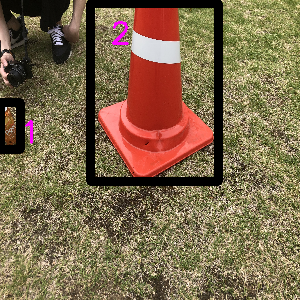

[ 66.44345  99.60317  87.5744  133.53175]
[149.33035    3.472222 266.29465  119.742065]
[ 66.44345  99.60317  87.5744  133.53175]
[149.33035    3.472222 266.29465  119.742065]
[ 66.44345  99.60317  87.5744  133.53175]
[149.33035    3.472222 266.29465  119.742065]
[ 66.44345  99.60317  87.5744  133.53175]
[149.33035    3.472222 266.29465  119.742065]
[ 66.44345  99.60317  87.5744  133.53175]
[149.33035    3.472222 266.29465  119.742065]


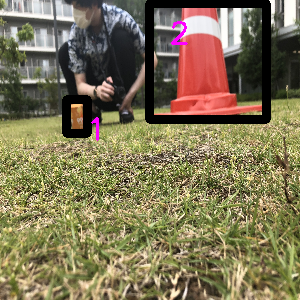

[ 58.705357 119.14683   80.729164 161.21031 ]
[117.85714     2.8769841 194.71727   147.32143  ]
[ 58.705357 119.14683   80.729164 161.21031 ]
[117.85714     2.8769841 194.71727   147.32143  ]
[ 58.705357 119.14683   80.729164 161.21031 ]
[117.85714     2.8769841 194.71727   147.32143  ]
[ 58.705357 119.14683   80.729164 161.21031 ]
[117.85714     2.8769841 194.71727   147.32143  ]
[ 58.705357 119.14683   80.729164 161.21031 ]
[117.85714     2.8769841 194.71727   147.32143  ]


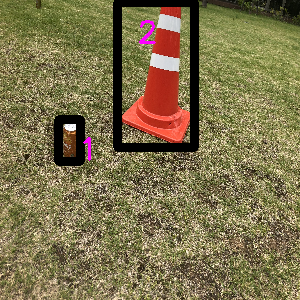

[152.8274    86.309525 177.45535  131.25    ]
[137.2768   120.337296 144.64285  132.44048 ]
[152.8274    86.309525 177.45535  131.25    ]
[137.2768   120.337296 144.64285  132.44048 ]
[152.8274    86.309525 177.45535  131.25    ]
[137.2768   120.337296 144.64285  132.44048 ]
[152.8274    86.309525 177.45535  131.25    ]
[137.2768   120.337296 144.64285  132.44048 ]
[152.8274    86.309525 177.45535  131.25    ]
[137.2768   120.337296 144.64285  132.44048 ]


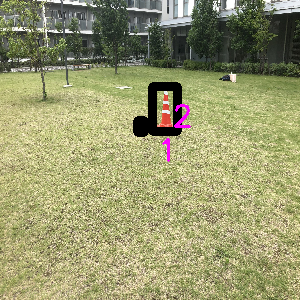

[142.0387   93.25397 148.06548 101.28968]
[158.40775  54.06746 184.30058 101.28968]
[142.0387   93.25397 148.06548 101.28968]
[158.40775  54.06746 184.30058 101.28968]
[142.0387   93.25397 148.06548 101.28968]
[158.40775  54.06746 184.30058 101.28968]
[142.0387   93.25397 148.06548 101.28968]
[158.40775  54.06746 184.30058 101.28968]
[142.0387   93.25397 148.06548 101.28968]
[158.40775  54.06746 184.30058 101.28968]


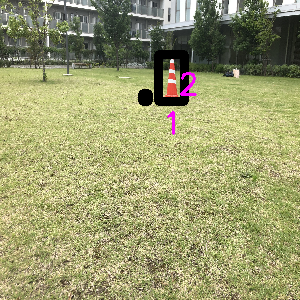

[110.49107 124.30556 119.56845 134.62302]
[130.80357  82.34127 155.80357 130.65477]
[110.49107 124.30556 119.56845 134.62302]
[130.80357  82.34127 155.80357 130.65477]
[110.49107 124.30556 119.56845 134.62302]
[130.80357  82.34127 155.80357 130.65477]
[110.49107 124.30556 119.56845 134.62302]
[130.80357  82.34127 155.80357 130.65477]
[110.49107 124.30556 119.56845 134.62302]
[130.80357  82.34127 155.80357 130.65477]


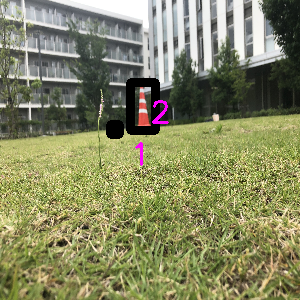

[137.2768   78.2738  144.64285  92.06349]
[158.85417  33.92857 191.22025  92.06349]
[137.2768   78.2738  144.64285  92.06349]
[158.85417  33.92857 191.22025  92.06349]
[137.2768   78.2738  144.64285  92.06349]
[158.85417  33.92857 191.22025  92.06349]
[137.2768   78.2738  144.64285  92.06349]
[158.85417  33.92857 191.22025  92.06349]
[137.2768   78.2738  144.64285  92.06349]
[158.85417  33.92857 191.22025  92.06349]


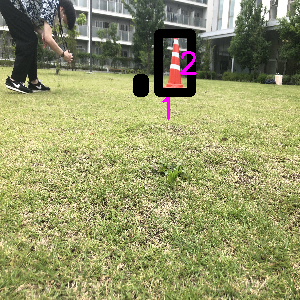

[122.172615  52.97619  127.75298   64.48412 ]
[142.85715    2.281746 176.5625    65.57539 ]
[122.172615  52.97619  127.75298   64.48412 ]
[142.85715    2.281746 176.5625    65.57539 ]
[122.172615  52.97619  127.75298   64.48412 ]
[142.85715    2.281746 176.5625    65.57539 ]
[122.172615  52.97619  127.75298   64.48412 ]
[142.85715    2.281746 176.5625    65.57539 ]
[122.172615  52.97619  127.75298   64.48412 ]
[142.85715    2.281746 176.5625    65.57539 ]


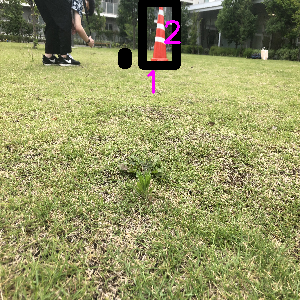

[106.17559  84.62302 114.36012 100.19842]
[132.5149    24.702381 168.37798   95.53571 ]
[106.17559  84.62302 114.36012 100.19842]
[132.5149    24.702381 168.37798   95.53571 ]
[106.17559  84.62302 114.36012 100.19842]
[132.5149    24.702381 168.37798   95.53571 ]
[106.17559  84.62302 114.36012 100.19842]
[132.5149    24.702381 168.37798   95.53571 ]
[106.17559  84.62302 114.36012 100.19842]
[132.5149    24.702381 168.37798   95.53571 ]


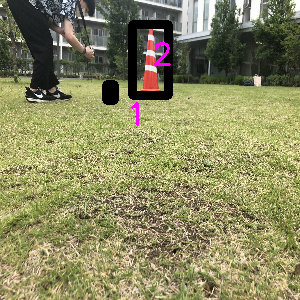

[ 81.54762  89.18651  91.07143 105.85317]
[115.6994    13.789682 157.5893   101.28968 ]
[ 81.54762  89.18651  91.07143 105.85317]
[115.6994    13.789682 157.5893   101.28968 ]
[ 81.54762  89.18651  91.07143 105.85317]
[115.6994    13.789682 157.5893   101.28968 ]
[ 81.54762  89.18651  91.07143 105.85317]
[115.6994    13.789682 157.5893   101.28968 ]
[ 81.54762  89.18651  91.07143 105.85317]
[115.6994    13.789682 157.5893   101.28968 ]


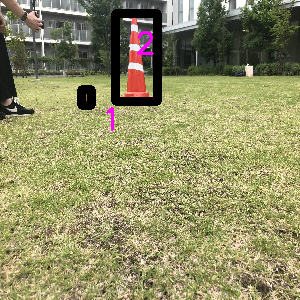

[ 65.77381   88.19445   77.82738  108.928566]
[112.05357     1.5873015 163.83928   111.0119   ]
[ 65.77381   88.19445   77.82738  108.928566]
[112.05357     1.5873015 163.83928   111.0119   ]
[ 65.77381   88.19445   77.82738  108.928566]
[112.05357     1.5873015 163.83928   111.0119   ]
[ 65.77381   88.19445   77.82738  108.928566]
[112.05357     1.5873015 163.83928   111.0119   ]
[ 65.77381   88.19445   77.82738  108.928566]
[112.05357     1.5873015 163.83928   111.0119   ]


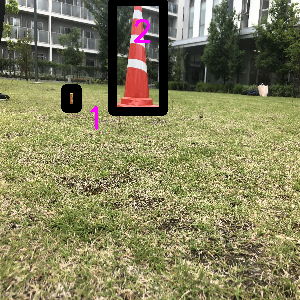

[ 78.05059   74.80159   90.997025 100.09921 ]
[138.69048     1.0912699 218.5268     98.90873  ]
[ 78.05059   74.80159   90.997025 100.09921 ]
[138.69048     1.0912699 218.5268     98.90873  ]
[ 78.05059   74.80159   90.997025 100.09921 ]
[138.69048     1.0912699 218.5268     98.90873  ]
[ 78.05059   74.80159   90.997025 100.09921 ]
[138.69048     1.0912699 218.5268     98.90873  ]
[ 78.05059   74.80159   90.997025 100.09921 ]
[138.69048     1.0912699 218.5268     98.90873  ]


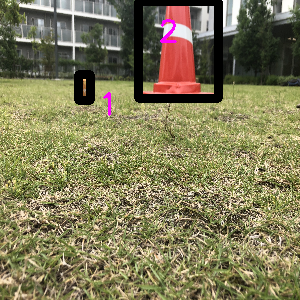

[ 27.157738  74.206345  56.101192 125.992065]
[139.43452     2.8769841 293.5268    108.23412  ]
[ 27.157738  74.206345  56.101192 125.992065]
[139.43452     2.8769841 293.5268    108.23412  ]
[ 27.157738  74.206345  56.101192 125.992065]
[139.43452     2.8769841 293.5268    108.23412  ]
[ 27.157738  74.206345  56.101192 125.992065]
[139.43452     2.8769841 293.5268    108.23412  ]
[ 27.157738  74.206345  56.101192 125.992065]
[139.43452     2.8769841 293.5268    108.23412  ]


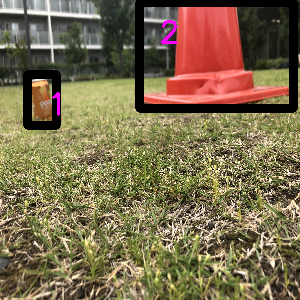

[110.49107   71.9246   125.595245 100.09921 ]
[110.49107   71.9246   125.595245 100.09921 ]
[110.49107   71.9246   125.595245 100.09921 ]


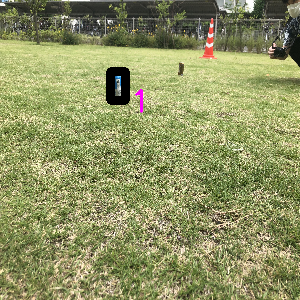

[46.205357 66.76588  55.729168 84.02778 ]
[ 98.4375  132.34126 110.49107 154.7619 ]
[46.205357 66.76588  55.729168 84.02778 ]
[ 98.4375  132.34126 110.49107 154.7619 ]
[46.205357 66.76588  55.729168 84.02778 ]
[ 98.4375  132.34126 110.49107 154.7619 ]
[46.205357 66.76588  55.729168 84.02778 ]
[ 98.4375  132.34126 110.49107 154.7619 ]
[46.205357 66.76588  55.729168 84.02778 ]
[ 98.4375  132.34126 110.49107 154.7619 ]


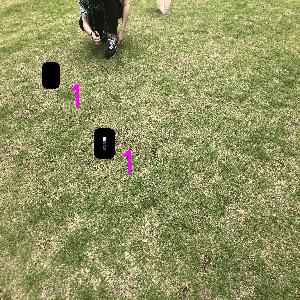

[48.809525 66.17063  63.020836 89.18651 ]
[214.50893  77.67857 231.77083 113.39285]
[48.809525 66.17063  63.020836 89.18651 ]
[214.50893  77.67857 231.77083 113.39285]
[48.809525 66.17063  63.020836 89.18651 ]
[214.50893  77.67857 231.77083 113.39285]
[48.809525 66.17063  63.020836 89.18651 ]
[214.50893  77.67857 231.77083 113.39285]
[48.809525 66.17063  63.020836 89.18651 ]
[214.50893  77.67857 231.77083 113.39285]


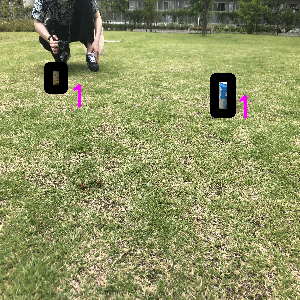

[202.45535  75.99206 223.1399  109.3254 ]
[  0.4464285  86.309525   11.681548  120.833336 ]
[202.45535  75.99206 223.1399  109.3254 ]
[  0.4464285  86.309525   11.681548  120.833336 ]
[202.45535  75.99206 223.1399  109.3254 ]
[  0.4464285  86.309525   11.681548  120.833336 ]
[202.45535  75.99206 223.1399  109.3254 ]
[  0.4464285  86.309525   11.681548  120.833336 ]
[202.45535  75.99206 223.1399  109.3254 ]
[  0.4464285  86.309525   11.681548  120.833336 ]


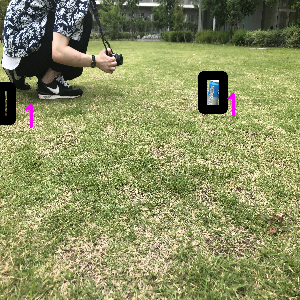

[ 20.3125  214.08731  43.60119 240.5754 ]
[227.9018  141.56746 238.24405 159.4246 ]
[156.69643  42.55952 209.375   157.6389 ]
[ 20.3125  214.08731  43.60119 240.5754 ]
[227.9018  141.56746 238.24405 159.4246 ]
[156.69643  42.55952 209.375   157.6389 ]
[ 20.3125  214.08731  43.60119 240.5754 ]
[227.9018  141.56746 238.24405 159.4246 ]
[156.69643  42.55952 209.375   157.6389 ]
[ 20.3125  214.08731  43.60119 240.5754 ]
[227.9018  141.56746 238.24405 159.4246 ]
[156.69643  42.55952 209.375   157.6389 ]
[ 20.3125  214.08731  43.60119 240.5754 ]
[227.9018  141.56746 238.24405 159.4246 ]
[156.69643  42.55952 209.375   157.6389 ]


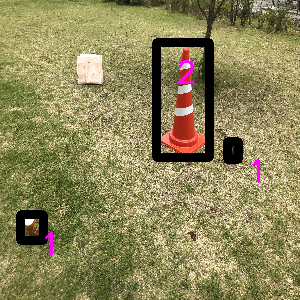

[117.85714 128.96825 148.95834 194.54366]
[117.85714 128.96825 148.95834 194.54366]
[117.85714 128.96825 148.95834 194.54366]
[117.85714 128.96825 148.95834 194.54366]
[117.85714 128.96825 148.95834 194.54366]


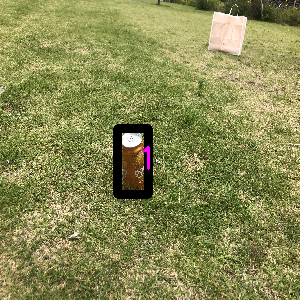

[123.88393   44.940475 157.5893   102.48016 ]
[123.88393   44.940475 157.5893   102.48016 ]
[123.88393   44.940475 157.5893   102.48016 ]
[123.88393   44.940475 157.5893   102.48016 ]
[123.88393   44.940475 157.5893   102.48016 ]


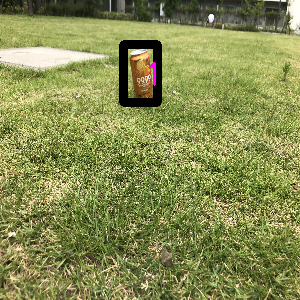

[106.62202   44.940475 142.85715  124.40476 ]
[ 34.07738 172.61905  50.44643 195.63492]
[106.62202   44.940475 142.85715  124.40476 ]
[ 34.07738 172.61905  50.44643 195.63492]
[106.62202   44.940475 142.85715  124.40476 ]
[ 34.07738 172.61905  50.44643 195.63492]
[106.62202   44.940475 142.85715  124.40476 ]
[ 34.07738 172.61905  50.44643 195.63492]
[106.62202   44.940475 142.85715  124.40476 ]
[ 34.07738 172.61905  50.44643 195.63492]


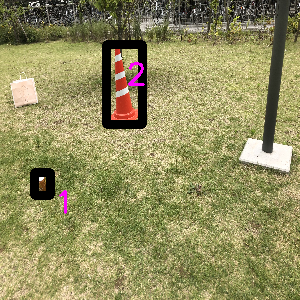

[104.01785  50.09921 153.64584 160.61508]
[104.01785  50.09921 153.64584 160.61508]
[104.01785  50.09921 153.64584 160.61508]
[104.01785  50.09921 153.64584 160.61508]
[104.01785  50.09921 153.64584 160.61508]


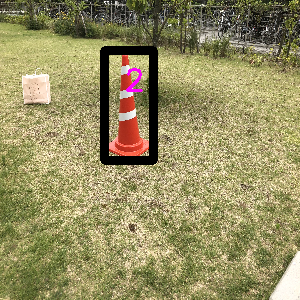

[ 47.916668   5.15873  122.172615 128.86905 ]
[ 47.916668   5.15873  122.172615 128.86905 ]
[ 47.916668   5.15873  122.172615 128.86905 ]
[ 47.916668   5.15873  122.172615 128.86905 ]
[ 47.916668   5.15873  122.172615 128.86905 ]


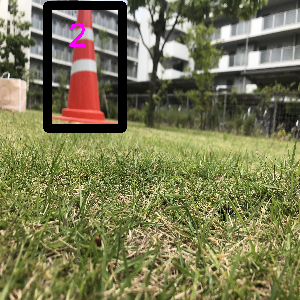

[119.56845   17.857143 186.01192  157.7381  ]
[119.56845   17.857143 186.01192  157.7381  ]
[119.56845   17.857143 186.01192  157.7381  ]
[119.56845   17.857143 186.01192  157.7381  ]
[119.56845   17.857143 186.01192  157.7381  ]


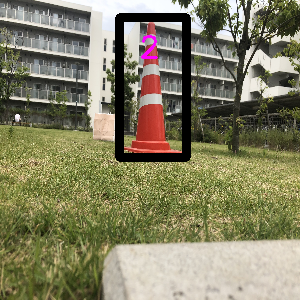

[ 62.127975  58.73016  116.071434 182.44048 ]
[ 62.127975  58.73016  116.071434 182.44048 ]
[ 62.127975  58.73016  116.071434 182.44048 ]
[ 62.127975  58.73016  116.071434 182.44048 ]
[ 62.127975  58.73016  116.071434 182.44048 ]


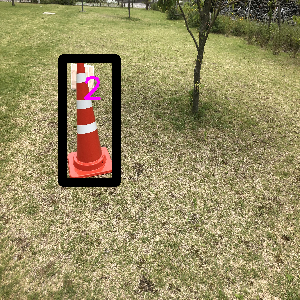

[ 69.49405   56.944447 129.09225  192.75793 ]
[ 69.49405   56.944447 129.09225  192.75793 ]
[ 69.49405   56.944447 129.09225  192.75793 ]
[ 69.49405   56.944447 129.09225  192.75793 ]
[ 69.49405   56.944447 129.09225  192.75793 ]


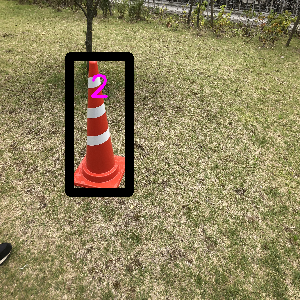

[272.39584 233.63095 298.2887  298.11508]
[272.39584 233.63095 298.2887  298.11508]
[272.39584 233.63095 298.2887  298.11508]
[272.39584 233.63095 298.2887  298.11508]
[272.39584 233.63095 298.2887  298.11508]


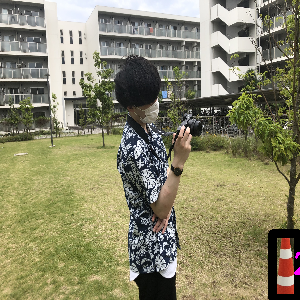

In [8]:
for i in range(len(val_dataset)):
    _ = val_dataset[i]